# Shared patterns of ILS across chromosomes

In [5]:
%matplotlib inline

import numpy as np
import pandas as pd
from pandas import DataFrame, Series
import warnings
from scipy import signal, stats
from statsmodels.nonparametric.smoothers_lowess import lowess

from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina', 'png')

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Rectangle
from matplotlib.lines import Line2D

import mpld3

from horizonplot import horizonplot
from chromwindow import window
import mygene
from geneinfo import geneinfo, geneplot, connect_mygene

import seaborn as sns
sns.set()
sns.set_style("ticks")
sns.set_context("notebook")

def add_band(x_low, x_high, y_low=None, y_high=None, ax=None, color='gray', linewidth=0, alpha=0.5, zorder=0, **kwargs):
    "Plot a gray block on x interval"
    if ax is None:
        ax = plt.gca()
    if y_low is None:
        y_low, _ = ax.get_ylim()
    if y_high is None:
        _, y_high = ax.get_ylim()
    g = ax.add_patch(Rectangle((x_low, y_low), x_high-x_low, y_high-y_low, 
                 facecolor=color,
                 linewidth=linewidth,
                 alpha=alpha,
                 zorder=zorder,
                 **kwargs))

def stairs(df, start='start', end='end', pos='pos', endtrim=0):
    "Turn a df with start, end into one with pos to plot as stairs"
    df1 = df.copy(deep=True)
    df2 = df.copy(deep=True)
    df1[pos] = df1[start]
    df2[pos] = df2[end] - endtrim
    return pd.concat([df1, df2]).sort_values([start, end])

# My own paired palette replacing the last brown pair with violets
sns.color_palette('Paired').as_hex()
Paired = sns.color_palette(['#a6cee3', '#1f78b4', '#b2df8a', '#33a02c', '#fb9a99', '#e31a1c',
                            '#fdbf6f', '#ff7f00', '#cab2d6','#6a3d9a', '#e585cf', '#ad009d'])
#sns.palplot(Paired)
Infographics = sns.color_palette(['#e8615d', '#f49436', '#2d9de5', '#3bbdbd', '#634792'])
#sns.palplot(Infographics)

chromosomes = list(map(str, range(1,23))) + ['X']

In [ ]:
%%html
<style> table { font-variant-numeric: tabular-nums; } </style>

## Load ILS data

HDF is written in `nb01_horizons.ipynb`:

In [55]:
ils_data = pd.read_hdf('../results/ils_data.h5')
ils_data.head()

,chrom,start,end,analysis,V0,V1,V2,V3,tot_segment,propils,ilsskew,propils_z_score,ilsskew_z_score,names
0,1,0,100000,AOTNAN_SAGMID_CEBALB_HOMSAP,0,0,0,0,0,NaN,NaN,NaN,NaN,Aotus_nancymaae Saguinus_midas Cebus_albifrons...
1,1,100000,200000,AOTNAN_SAGMID_CEBALB_HOMSAP,0,0,0,0,0,NaN,NaN,NaN,NaN,Aotus_nancymaae Saguinus_midas Cebus_albifrons...
2,1,200000,300000,AOTNAN_SAGMID_CEBALB_HOMSAP,0,0,0,0,0,NaN,NaN,NaN,NaN,Aotus_nancymaae Saguinus_midas Cebus_albifrons...
3,1,300000,400000,AOTNAN_SAGMID_CEBALB_HOMSAP,0,0,0,0,0,NaN,NaN,NaN,NaN,Aotus_nancymaae Saguinus_midas Cebus_albifrons...
4,1,400000,500000,AOTNAN_SAGMID_CEBALB_HOMSAP,0,0,0,0,0,NaN,NaN,NaN,NaN,Aotus_nancymaae Saguinus_midas Cebus_albifrons...


# Accumulate evidence of ILS proportion and skew across trios

Only use subset of analyses with intermediate amounts of ILS:

In [56]:
global_mean_ils = ils_data.groupby(['analysis', 'names']).propils.mean().sort_values().to_frame().reset_index()

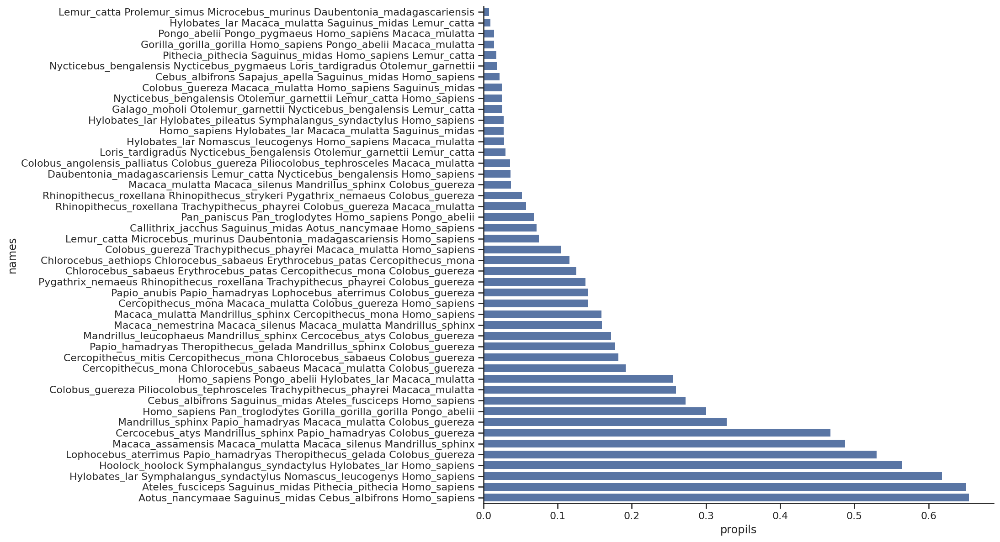

In [57]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sns.barplot(x='propils', y='names', data=global_mean_ils, color='b', ax=ax)
sns.despine()

Only consider a subset of analyses where mean ILS proportion is not close to either zero or 2/3:

In [58]:
analyses_subset = global_mean_ils.loc[(global_mean_ils.propils >= 0.1) & (global_mean_ils.propils <= 0.5), 'analysis']
analyses_subset

22    COLGUE_TRAPHA_MACMUL_HOMSAP
23    CHLAET_CHLSAB_ERYPAT_CERMON
24    CHLSAB_ERYPAT_CERMON_COLGUE
25    PYGNEM_RHIROX_TRAPHA_COLGUE
26    PAPANU_PAPHAM_LOPATE_COLGUE
27    CERMON_MACMUL_COLGUE_HOMSAP
28    MACMUL_MANSPH_CERMON_HOMSAP
29    MACNEM_MACSIL_MACMUL_MANSPH
30    MANLEU_MANSPH_CERATY_COLGUE
31    PAPHAM_THEGEL_MANSPH_COLGUE
32    CERMIT_CERMON_CHLSAB_COLGUE
33    CERMON_CHLSAB_MACMUL_COLGUE
34    HOMSAP_PONABE_HYLLAR_MACMUL
35    COLGUE_PILTEP_TRAPHA_MACMUL
36    CEBALB_SAGMID_ATEFUS_HOMSAP
37    HOMSAP_PANTRO_GORGOR_PONABE
38    MANSPH_PAPHAM_MACMUL_COLGUE
39    CERATY_MANSPH_PAPHAM_COLGUE
40    MACASS_MACMUL_MACSIL_MANSPH
Name: analysis, dtype: object

## Mean proportion of ILS

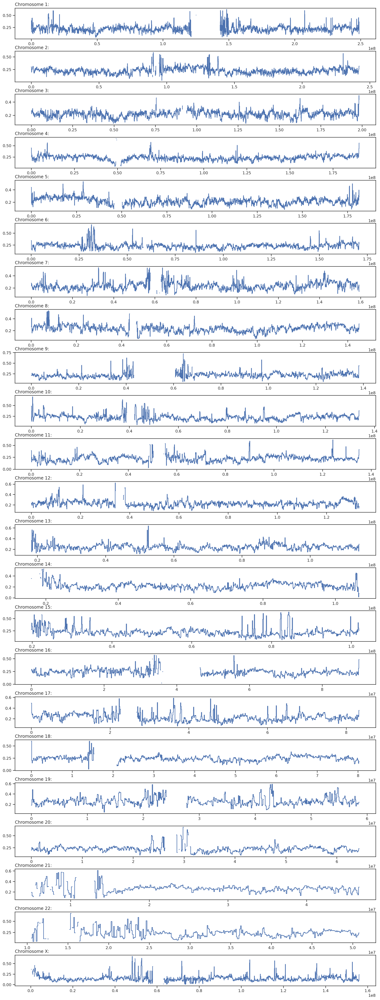

In [7]:
fig, ax = plt.subplots(23, 1, figsize=(18, 50))
for i, chrom in enumerate(chromosomes):
    plot_df = (ils_data
               .loc[(ils_data.chrom == chrom) & ils_data.analysis.isin(analyses_subset)]
               .groupby(['chrom', 'start', 'end'])
               .propils
               .agg('mean')
               .reset_index()
               .pipe(stairs)
              )
    ax[i].plot(plot_df.pos, plot_df.propils)
    ax[i].set_title(f'Chromosome {chrom}:', loc='left')
    plt.subplots_adjust(hspace=0.4)   

## Mean ILS z-score

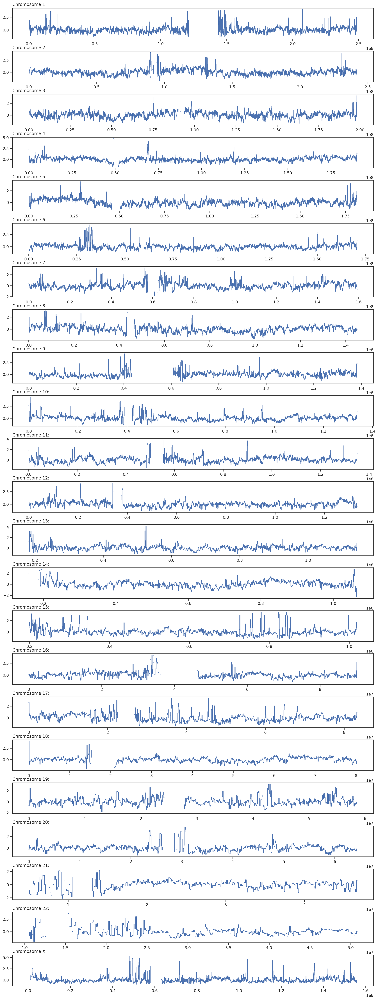

In [8]:
fig, ax = plt.subplots(23, 1, figsize=(18, 50))
for i, chrom in enumerate(chromosomes):
    plot_df = (ils_data
               .loc[(ils_data.chrom == chrom) & ils_data.analysis.isin(analyses_subset)]
               .groupby(['chrom', 'start', 'end'])
               .propils_z_score
               .agg('mean')
               .reset_index()
               .pipe(stairs)
              )
    ax[i].plot(plot_df.pos, plot_df.propils_z_score)
    ax[i].set_title(f'Chromosome {chrom}:', loc='left')
    plt.subplots_adjust(hspace=0.4)   

## Mean *absolute* ILS z-score

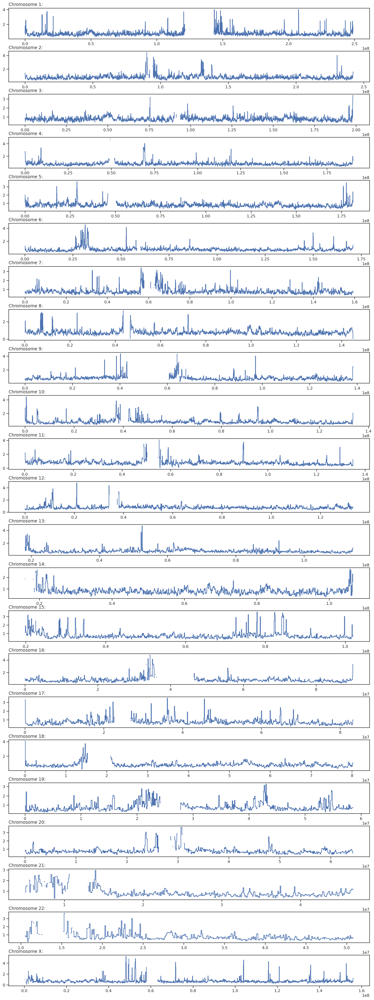

In [9]:
def absmean(sr):
    return np.absolute(sr).mean()

fig, ax = plt.subplots(23, 1, figsize=(18, 50))
for i, chrom in enumerate(chromosomes):
    plot_df = (ils_data
               .loc[(ils_data.chrom == chrom) & ils_data.analysis.isin(analyses_subset)]
               .groupby(['chrom', 'start', 'end'])
               .propils_z_score
               .agg(absmean)
               .reset_index()
               .pipe(stairs)
              )
    ax[i].plot(plot_df.pos, plot_df.propils_z_score)
    ax[i].set_title(f'Chromosome {chrom}:', loc='left')
    plt.subplots_adjust(hspace=0.4)  

## Mean of absolute skew

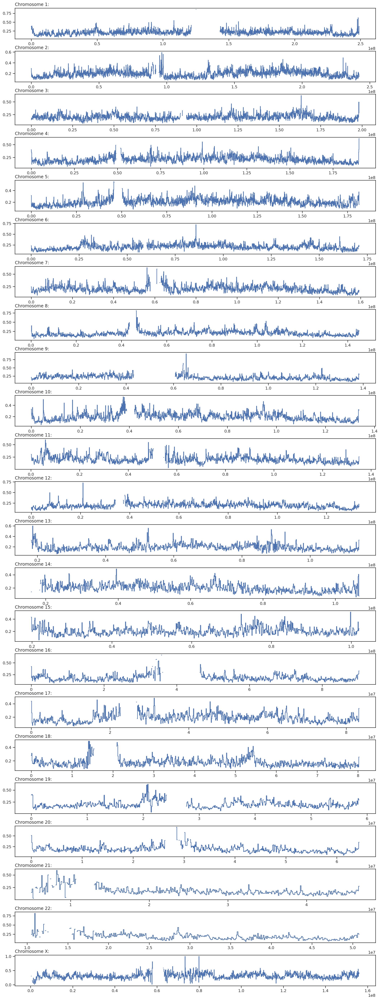

In [10]:
def absmean(sr):
    return np.absolute(sr).mean()

fig, ax = plt.subplots(23, 1, figsize=(18, 50))
for i, chrom in enumerate(chromosomes):
    plot_df = (ils_data
               .loc[(ils_data.chrom == chrom) & ils_data.analysis.isin(analyses_subset)]
               .groupby(['chrom', 'start', 'end'])
               .ilsskew
               .agg(absmean)
               .reset_index()
               .pipe(stairs)
              )
    ax[i].plot(plot_df.pos, plot_df.ilsskew)
    ax[i].set_title(f'Chromosome {chrom}:', loc='left')
    plt.subplots_adjust(hspace=0.4)   

### Mean of absolute skew z-score

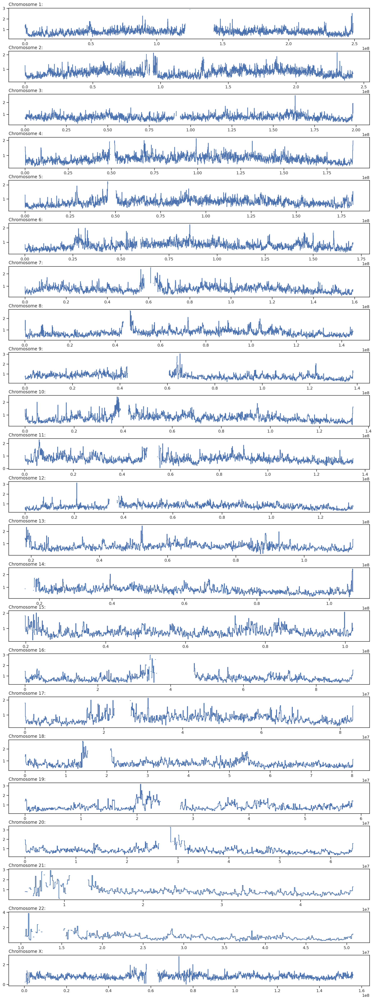

In [11]:
def absmean(sr):
    return np.absolute(sr).mean()

fig, ax = plt.subplots(23, 1, figsize=(18, 50))
for i, chrom in enumerate(chromosomes):
    plot_df = (ils_data
               .loc[(ils_data.chrom == chrom) & ils_data.analysis.isin(analyses_subset)]
               .groupby(['chrom', 'start', 'end'])
               .ilsskew_z_score
               .agg(absmean)
               .reset_index()
               .pipe(stairs)
              )
    ax[i].plot(plot_df.pos, plot_df.ilsskew_z_score)
    ax[i].set_title(f'Chromosome {chrom}:', loc='left')
    plt.subplots_adjust(hspace=0.4)   

## X chromosome

In [12]:
extended_peak_regions_10 = pd.read_hdf('/home/kmt/simons/faststorage/people/kmt/results/extended_peak_regions_10%.hdf')
extended_peak_regions_75 = pd.read_hdf('/home/kmt/simons/faststorage/people/kmt/results/extended_peak_regions_75%.hdf')
extended_peak_regions_90 = pd.read_hdf('/home/kmt/simons/faststorage/people/kmt/results/extended_peak_regions_90%.hdf')
human_chimp_low_ils_regions_chrX = pd.read_hdf('/home/kmt/simons/faststorage/people/kmt/results/human_chimp_low_ils_regions_chrX.hdf')

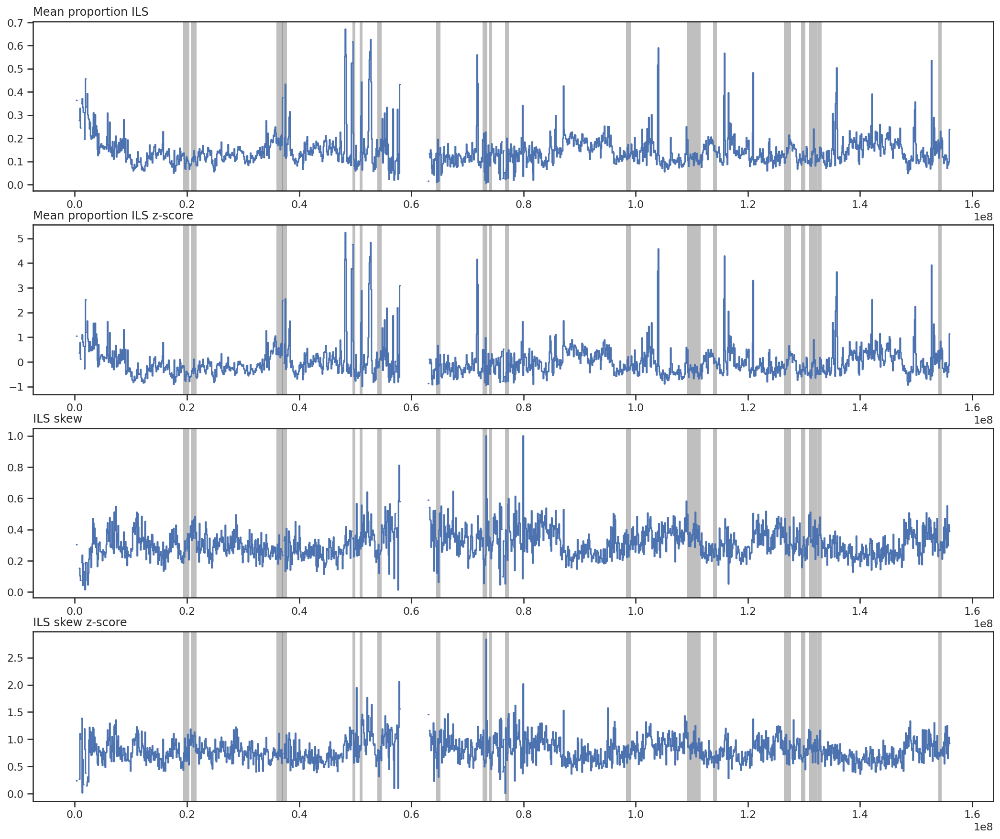

In [13]:
gr = ils_data.loc[(ils_data.chrom == 'X') & ils_data.analysis.isin(analyses_subset)].groupby(['chrom', 'start', 'end'])

fig, ax = plt.subplots(4, 1, figsize=(18, 15))

plot_df = gr.propils.agg('mean').reset_index().pipe(stairs)
ax[0].plot(plot_df.pos, plot_df.propils)
ax[0].set_title('Mean proportion ILS', loc='left')
for tup in extended_peak_regions_10.itertuples():
    add_band(tup.start_pos, tup.end_pos, ax=ax[0])
    
plot_df = gr.propils_z_score.agg('mean').reset_index().pipe(stairs)
ax[1].plot(plot_df.pos, plot_df.propils_z_score)
ax[1].set_title('Mean proportion ILS z-score', loc='left')
for tup in extended_peak_regions_10.itertuples():
    add_band(tup.start_pos, tup.end_pos, ax=ax[1])
    
plot_df = gr.ilsskew.agg(absmean).reset_index().pipe(stairs)
ax[2].plot(plot_df.pos, plot_df.ilsskew)
ax[2].set_title('ILS skew', loc='left')
for tup in extended_peak_regions_10.itertuples():
    add_band(tup.start_pos, tup.end_pos, ax=ax[2])

plot_df = gr.ilsskew_z_score.agg(absmean).reset_index().pipe(stairs)
ax[3].plot(plot_df.pos, plot_df.ilsskew_z_score)
ax[3].set_title('ILS skew z-score', loc='left')
for tup in extended_peak_regions_10.itertuples():
    add_band(tup.start_pos, tup.end_pos, ax=ax[3])

### Detail of 3 chromosome region

Text(0.0, 1.0, 'ILS skew z-score')

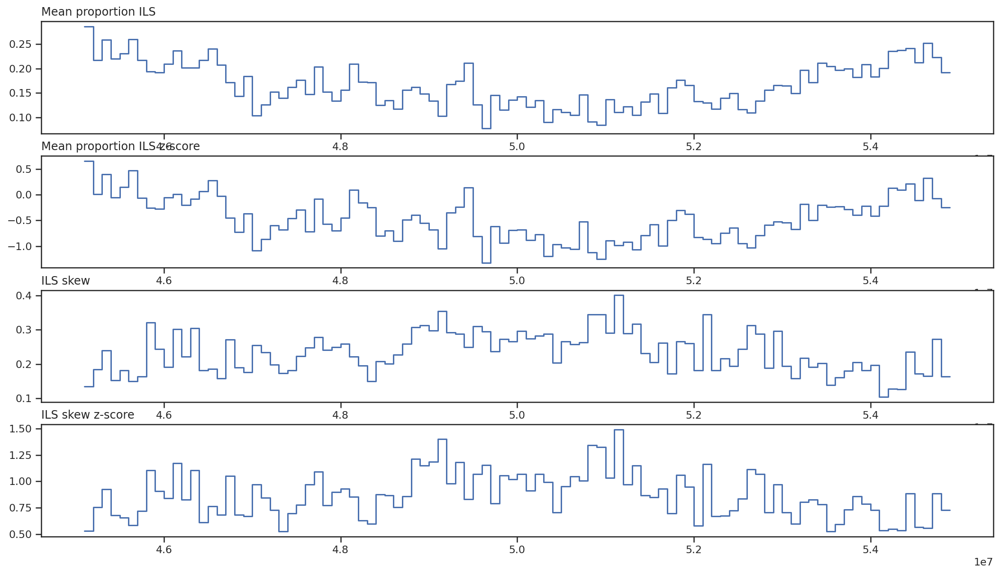

In [14]:
gr = ils_data.loc[(ils_data.chrom == '3') & (ils_data.start > 45e6) & (ils_data.end < 55e6) \
                  & ils_data.analysis.isin(analyses_subset)].groupby(['chrom', 'start', 'end'])

fig, ax = plt.subplots(4, 1, figsize=(18, 10))

plot_df = gr.propils.agg('mean').reset_index().pipe(stairs)
ax[0].plot(plot_df.pos, plot_df.propils)
ax[0].set_title('Mean proportion ILS', loc='left')
    
plot_df = gr.propils_z_score.agg('mean').reset_index().pipe(stairs)
ax[1].plot(plot_df.pos, plot_df.propils_z_score)
ax[1].set_title('Mean proportion ILS z-score', loc='left')
    
plot_df = gr.ilsskew.agg(absmean).reset_index().pipe(stairs)
ax[2].plot(plot_df.pos, plot_df.ilsskew)
ax[2].set_title('ILS skew', loc='left')

plot_df = gr.ilsskew_z_score.agg(absmean).reset_index().pipe(stairs)
ax[3].plot(plot_df.pos, plot_df.ilsskew_z_score)
ax[3].set_title('ILS skew z-score', loc='left')

## Load low ils regions

In [59]:
low_ils_reg = pd.read_csv('../steps/merge_low_data/merged_low_ils_regions.csv').sort_values(by=['start', 'end'])
low_ils_reg.head()

,chrom,analysis,start,end
2165,6,PITPIT_SAGMID_HOMSAP_LEMCAT,200000,900000
1313,18,HYLLAR_MACMUL_SAGMID_LEMCAT,300000,1000000
1376,20,HYLLAR_MACMUL_SAGMID_LEMCAT,300000,1000000
1610,9,HYLLAR_MACMUL_SAGMID_LEMCAT,800000,2000000
2049,9,NYCBEN_NYCPYG_LORTAR_OTOGAR,1200000,1900000


In [60]:
@window(size=100000, fill='hg38')
def low_ils_total(df):
    return (df.end-df.start).sum()

low_ils_totals = (low_ils_reg
                  .loc[low_ils_reg.analysis.isin(analyses_subset)]
                  .groupby('chrom')
                  .apply(low_ils_total)
                  .reset_index(drop=True, level=-1)
                  .reset_index()
                 )
low_ils_totals.head()

,chrom,start,end,low_ils_total
0,1,0,100000,0
1,1,100000,200000,0
2,1,200000,300000,0
3,1,300000,400000,0
4,1,400000,500000,0


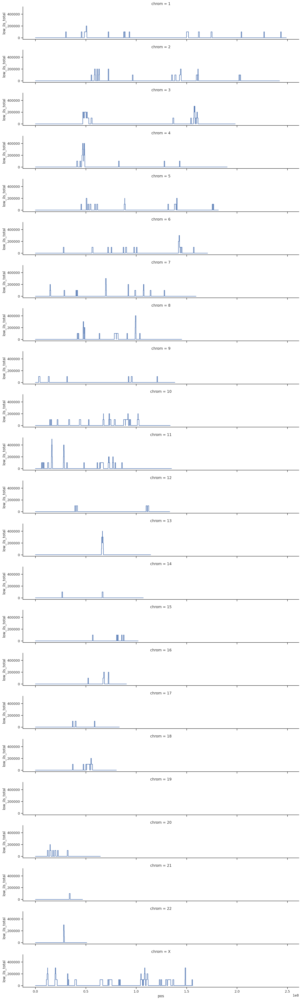

In [61]:
plot_df = stairs(low_ils_totals)
g = sns.FacetGrid(plot_df, row='chrom', height=2, aspect=7, row_order=chromosomes)
g.map(plt.plot,'pos', 'low_ils_total') ;

### Chromosome 3 region detail 

In [ ]:
mg = mygene.MyGeneInfo()
connect_mygene(mg)

In [ ]:
chrom, start, end = 'chr3', 49500000, 50500000
ax = geneplot(chrom, start, end, figsize=(10, 5))

ax.plot(np.linspace(start, end, 1000), np.random.random(1000), 'o') ;

mpld3.display()

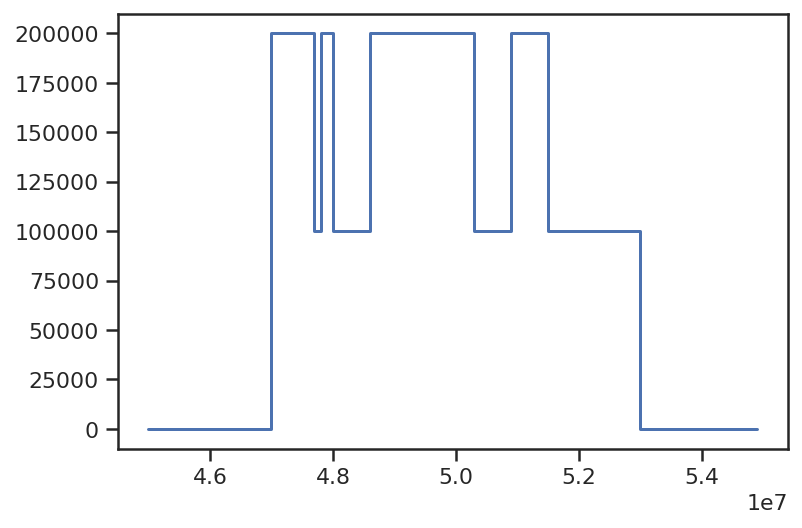

In [88]:
plot_df = stairs(low_ils_totals.loc[lambda df: (df.chrom == '3') &(df.start >= 45e6) & (df.end < 55e6)])
plt.plot(plot_df.pos, plot_df.low_ils_total) ;

### Chromosome X detail 

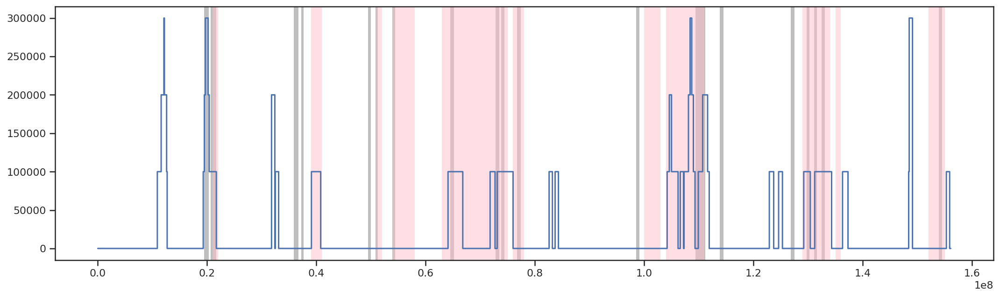

In [86]:
plt.figure(figsize=(18, 5))
plot_df = stairs(low_ils_totals.loc[lambda df: (df.chrom == 'X')])
plt.plot(plot_df.pos, plot_df.low_ils_total)
for tup in extended_peak_regions_75.itertuples():
    add_band(tup.start_pos, tup.end_pos, color='grey')
for tup in human_chimp_low_ils_regions_chrX.itertuples():
    add_band(tup.start, tup.end, color='pink')

**TODO:**

- Separate species contributions
- Try less stringent low-ILS criterion

## Identify overlapping genes

In [ ]:
# for gene in mg.query('q=chr2:49500000-50000000 AND type_of_gene:protein-coding', species='human', fetch_all=True):
#     geneinfo(gene['symbol'])

Connect Mygene service:

In [8]:
mg = mygene.MyGeneInfo()
connect_mygene(mg)

Plot genes in a region:

In [18]:
# make gene plot for region:
ax = geneplot('chr3', 49000000, 51000000, figsize=(12, 5))

# use regturned axis to plot whatever in the top panel:
ax.plot(np.linspace(49000000, 51000000, 1000), np.random.random(1000), 'o') ;

# use mpld3 to display to you can zoom and pan in the plot:
mpld3.display()

Fetching 103 gene(s) . . .


In [21]:
geneinfo(['IHO1', 'USP4', 'HYAL3', 'HYAL1', 'HYAL2', 'NAA80', 'LSMEM2', 'IFRD2'])

**Symbol:** **_IHO1_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CCDC36, CT74, LELA1  
*interactor of HORMAD1 1*  
**Genomic position:** 3:49198428-49258106 (hg38), 3:49235861-49295537 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=IHO1)  


 ----

**Symbol:** **_USP4_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** UNP, Unph  
*ubiquitin specific peptidase 4*  
**Summary:** The protein encoded by this gene is a protease that deubiquitinates target proteins such as ADORA2A and TRIM21. The encoded protein shuttles between the nucleus and cytoplasm and is involved in maintaining operational fidelity in the endoplasmic reticulum. Three transcript variants encoding different isoforms have been found for this gene. [provided by RefSeq, Oct 2011].  
**Genomic position:** 3:49277144-49340712 (hg38), 3:49315264-49378145 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=USP4)  


 ----

**Symbol:** **_HYAL3_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** HYAL-3, LUCA-3, LUCA3  
*hyaluronidase 3*  
**Summary:** This gene encodes a member of the hyaluronidase family. Hyaluronidases are endoglycosidase enzymes that degrade hyaluronan, one of the major glycosaminoglycans of the extracellular matrix. The regulated turnover of hyaluronan plays a critical role in many biological processes including cell proliferation, migration and differentiation. The encoded protein may also play an important role in sperm function. This gene is one of several related genes in a region of chromosome 3p21.3 associated with tumor suppression, and the expression of specific transcript variants may be indicative of tumor status. Alternatively spliced transcript variants encoding multiple isoforms have been observed for this gene, and some isoforms may lack hyaluronidase activity. This gene overlaps and is on the same strand as N-acetyltransferase 6 (GCN5-related), and some transcripts of each gene share a portion of the first exon. [provided by RefSeq, Jan 2011].  
**Genomic position:** 3:50292831-50299405 (hg38), 3:50330262-50336899, HG325_PATCH:50330263-50336900 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=HYAL3)  


 ----

**Symbol:** **_HYAL1_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** HYAL-1, LUCA1, MPS9, NAT6  
*hyaluronidase 1*  
**Summary:** This gene encodes a lysosomal hyaluronidase. Hyaluronidases intracellularly degrade hyaluronan, one of the major glycosaminoglycans of the extracellular matrix. Hyaluronan is thought to be involved in cell proliferation, migration and differentiation. This enzyme is active at an acidic pH and is the major hyaluronidase in plasma. Mutations in this gene are associated with mucopolysaccharidosis type IX, or hyaluronidase deficiency. The gene is one of several related genes in a region of chromosome 3p21.3 associated with tumor suppression. Multiple transcript variants encoding different isoforms have been found for this gene. [provided by RefSeq, Jul 2008].  
**Genomic position:** 3:50299890-50312381 (hg38), 3:50337320-50349812, HG325_PATCH:50337321-50349813 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=HYAL1)  


 ----

**Symbol:** **_HYAL2_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** LUCA2  
*hyaluronidase 2*  
**Summary:** This gene encodes a weak acid-active hyaluronidase. The encoded protein is similar in structure to other more active hyaluronidases. Hyaluronidases degrade hyaluronan, one of the major glycosaminoglycans of the extracellular matrix. Hyaluronan and fragments of hyaluronan are thought to be involved in cell proliferation, migration and differentiation. Although it was previously thought to be a lysosomal hyaluronidase that is active at a pH below 4, the encoded protein is likely a GPI-anchored cell surface protein. This hyaluronidase serves as a receptor for the oncogenic virus Jaagsiekte sheep retrovirus. The gene is one of several related genes in a region of chromosome 3p21.3 associated with tumor suppression. This gene encodes two alternatively spliced transcript variants which differ only in the 5' UTR.[provided by RefSeq, Mar 2010].  
**Genomic position:** 3:50317790-50322782 (hg38), 3:50355221-50360337, HG325_PATCH:50355222-50360338 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=HYAL2)  


 ----

**Symbol:** **_NAA80_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** FUS-2, FUS2, HsNAAA80, NAT6  
*N-alpha-acetyltransferase 80, NatH catalytic subunit*  
**Summary:** This gene encodes a member of the N-acetyltransferase family. N-acetyltransferases modify proteins by transferring acetyl groups from acetyl CoA to the N-termini of protein substrates. The encoded protein is a cytoplasmic N-acetyltransferase with a substrate specificity for proteins with an N-terminal methionine. This gene is located in the tumor suppressor gene region on chromosome 3p21.3 and the encoded protein may play a role in cancer. Alternatively spliced transcript variants encoding multiple isoforms have been observed. This gene overlaps and is on the same strand as hyaluronoglucosaminidase 3, and some transcripts of each gene share a portion of the first exon. [provided by RefSeq, Jan 2011].  
**Genomic position:** 3:50296402-50299421 (hg38), 3:50333833-50336852, HG325_PATCH:50333834-50336853 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=NAA80)  


 ----

**Symbol:** **_LSMEM2_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** C3orf45  
*leucine rich single-pass membrane protein 2*  
**Genomic position:** 3:50279087-50288114 (hg38), 3:50316458-50325545, HG325_PATCH:50316459-50325546 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=LSMEM2)  


 ----

**Symbol:** **_IFRD2_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** IFNRP, SKMc15, SM15  
*interferon related developmental regulator 2*  
**Genomic position:** 3:50287732-50292918 (hg38), 3:50325163-50330349, HG325_PATCH:50325164-50330027, HG325_PATCH:50325175-50330350 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=IFRD2)  


 ----

## Gene plots / Enrichment / Heat propagation / GOATOOLS